# Семинар 1 - Основы работы с OpenCV, цветовые пространства, интегральные изображения

***

Источник используемого аэрофотоснимка: https://sovzond.ru/upload/medialibrary/267/%D0%98%D1%81%D1%85%D0%BE%D0%B4%D0%BD%D1%8B%D0%B9-%D0%B0%D1%8D%D1%80%D0%BE%D1%84%D0%BE%D1%82%D0%BE%D1%81%D0%BD%D0%B8%D0%BC%D0%BE%D0%BA.jpg

In [1]:
from pathlib import Path

import cv2
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
IMG_PATH = "data/Lenna_test_image.jpeg"

if not Path(IMG_PATH).exists():
    !git clone https://github.com/alexmelekhin/cv_course_2025.git
    !mv cv_course_2024/seminars/seminar_01/data .

# 1. Основы работы с OpenCV

## Чтение, отображение и сохранение изображений

Для чтения изображения из файла используется функция `cv2.imread`, для отображения изображения на экране - функция `cv2.imshow`, для сохранения изображения в файл - функция `cv2.imwrite`.

`cv2.imread(path, flag)` - читает изображение из файла по пути path. Флаг flag определяет формат считывания изображения. Возможные значения флага:
- `cv2.IMREAD_COLOR` - считывание изображения в цвете (значение по умолчанию, можно не указывать в явном виде)
- `cv2.IMREAD_UNCHANGED` - считывание изображения в цвете "как есть" (с альфа-каналом, если он есть)
- `cv2.IMREAD_GRAYSCALE` - считывание изображения в оттенках серого

In [3]:
img = cv2.imread(IMG_PATH, cv2.IMREAD_COLOR)  # cv2.IMREAD_COLOR обычно не указывают, так как это значение по умолчанию

`cv2.imshow("window_name", image)` - отображает изображение img в окне с именем window_name. Если окно с таким именем не существует, то оно будет создано. Если окно существует, то оно будет очищено и в нем будет отображено изображение img.

Пример кода:
```python
import cv2

img = cv2.imread("image.jpg", cv2.IMREAD_COLOR)
cv2.imshow("image", img)
cv2.waitKey(0)  # ожидание нажатия клавиши, иначе окно закроется сразу же
cv2.destroyAllWindows()  # закрытие всех окон
```

Однако это работает только в скриптах при наличии GUI. Пример такого скрипта: [show_image.py](show_image.py)

В Jupyter Notebook для отображения изображения используется функция `plt.imshow`.

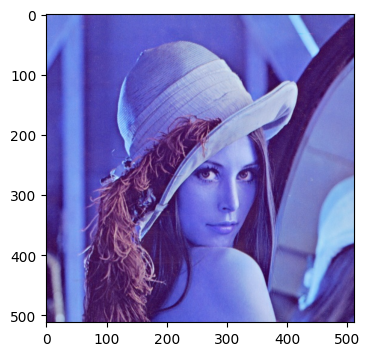

In [4]:
plt.figure(figsize=[4, 4])
plt.imshow(img);

Как видно, цвета изображения неправильные. **Функция `cv2.imread` считывает изображения в формате BGR** (blue, green, red). Чтобы перейти к более привычному представлению RGB (reg, green, blue), который ожидает matplotlib, можно воспользоваться встроенной функцией cvtColor:

In [5]:
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

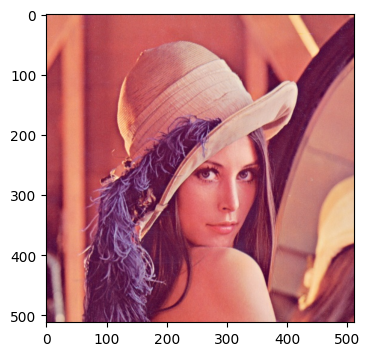

In [6]:
plt.figure(figsize=[4, 4])
plt.imshow(img_rgb);

## Работа с изображением

Загруженное цветное изображение является обычным numpy массивом с тремя размерностями (`shape` - (H, W, C), **channel-last**), каждый элемент которого - целое беззнаковое 8-ми битное число, представляющее квантованную на 256 уровней интенсивность одного из цветов:

In [7]:
print('type(img_rgb) = ', type(img_rgb))
print('img_rgb.shape = ', img_rgb.shape)
print('img_rgb.dtype = ', img_rgb.dtype)

type(img_rgb) =  <class 'numpy.ndarray'>
img_rgb.shape =  (512, 512, 3)
img_rgb.dtype =  uint8


Над изображением можно выполнять те же операции, что и над обычным массивом. Например, рассчитать статистики:

In [8]:
print('img_rgb.min() = ', img_rgb.min())
print('img_rgb.max() = ', img_rgb.max())
print('img_rgb.mean() = ', img_rgb.mean())
print('img_rgb.std() = ', img_rgb.std())
print('np.median(img_rgb) = ', np.median(img_rgb))

img_rgb.min() =  0
img_rgb.max() =  255
img_rgb.mean() =  128.22198232014975
img_rgb.std() =  58.942859735329606
np.median(img_rgb) =  119.0


присвоить какое-либо значение блоку(пикселю):

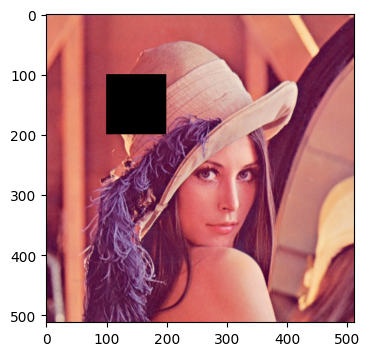

In [9]:
img_rgb_2 = img_rgb.copy()
img_rgb_2[100:200, 100:200] = 0

plt.figure(figsize=[4, 4])
plt.imshow(img_rgb_2);

прибавить какое-либо значение блоку(пикселю):

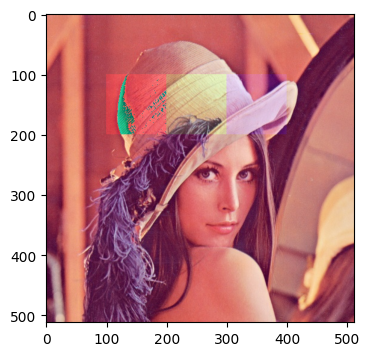

In [10]:
img_rgb_3 = img_rgb.copy()
img_rgb_3[100:200, 100:200, 0] += 40
img_rgb_3[100:200, 200:300, 1] += 40
img_rgb_3[100:200, 300:400, 2] += 40

plt.figure(figsize=[4, 4])
plt.imshow(img_rgb_3);

### Вопрос

- Что произошло с цветами на изображении img_rgb_3? Почему так произошло?

Добавляем  40 интенсивности к опеределенному каналу


## Альтернативы OpenCV

1. Библиотека `Pillow` (Python Imaging Library, PIL). В OpenCV изображения представляются в виде матриц, а в Pillow - в виде объектов класса `Image`.

In [11]:
from PIL import Image

img_pil = Image.open(IMG_PATH)
print('type(img_pil) = ', type(img_pil))
print('img_pil.size = ', img_pil.size)
print('img_pil.mode = ', img_pil.mode)

type(img_pil) =  <class 'PIL.JpegImagePlugin.JpegImageFile'>
img_pil.size =  (512, 512)
img_pil.mode =  RGB


2. Библиотека `scikit-image`. Изображения представлены в виде `np.ndarray`. Порядок каналов - **сразу RGB**. `shape` - (H, W, C), **channel-last**.

type(img_ski) =  <class 'numpy.ndarray'>
img_ski.shape =  (512, 512, 3)
img_ski.dtype =  uint8


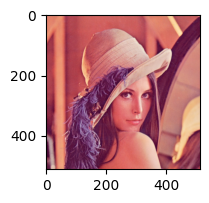

In [12]:
import skimage as ski

img_ski = ski.io.imread(IMG_PATH)
print('type(img_ski) = ', type(img_ski))
print('img_ski.shape = ', img_ski.shape)
print('img_ski.dtype = ', img_ski.dtype)

plt.figure(figsize=[2, 2])
plt.imshow(img_ski);

3. `torchvision` - библиотека для работы с изображениями, входящая в состав PyTorch. Изображения представлены в виде `torch.Tensor`. Порядок каналов - **сразу RGB**. `shape` - (C, H, W), **channel-first**.

In [13]:
from torchvision.io import read_image  # читает изображение сразу в формате torch.Tensor

img_torch = read_image(IMG_PATH)
print('type(img_torch) = ', type(img_torch))
print('img_torch.shape = ', img_torch.shape)
print('img_torch.dtype = ', img_torch.dtype)

type(img_torch) =  <class 'torch.Tensor'>
img_torch.shape =  torch.Size([3, 512, 512])
img_torch.dtype =  torch.uint8


4. **DALI** - библиотека для быстрой обработки изображений на GPU. Подробнее: https://developer.nvidia.com/blog/rapid-data-pre-processing-with-nvidia-dali/

## Упражнения

### Упражнение 1: BGR -> RGB
Реализуйте функцию преобразования изображения в формате BGR в формат RGB

In [14]:
def convert_color_bgr_to_rgb(img_bgr: np.ndarray) -> np.ndarray:
    return img_bgr[:, :, ::-1].copy()
    #  return cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

In [15]:
assert((img_rgb == convert_color_bgr_to_rgb(img)).all())

### Упражнение 2: Изменение яркости
Одним из простейших преобразований изображения является изменение уровня яркости, задаваемое следующим образом:

$$
f'(x, y) = \alpha f(x, y) + \beta
$$

Реализуйте данную операцию с помощью `cv2.convertScaleAbs` - [туториал](https://docs.opencv.org/4.x/d3/dc1/tutorial_basic_linear_transform.html).

В данном упражнении необходимо исследовать работу функции при различных значениях параметров. Протестируйте разные значения alpha и beta, например $\alpha \in \set{0.8, 1, 1.2, 2}$, $\beta \in \set{-10, 0, 10}$

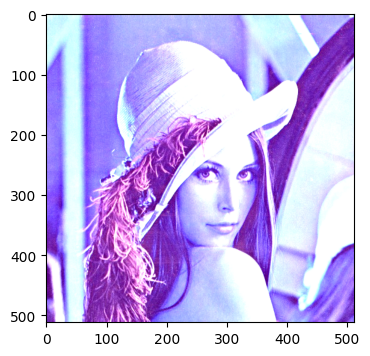

In [16]:
alpha = 2
beta = -10
image = cv2.imread(IMG_PATH, cv2.IMREAD_COLOR)
# new_image = np.zeros(image.shape, image.dtype)
new_image = np.clip(alpha * image.astype(np.int16) + beta, 0, 255).astype(np.uint8)


plt.figure(figsize=[4, 4])
plt.imshow(new_image);

### Упражнение 3: Смешивание изображений $\alpha - blend$

Другим простым преобразованием является смешивание двух изображений, задаваемое как:

$$
    f'(x, y) = \alpha f_1(x, y) + (1 - \alpha) f_2(x, y)
$$

Реализуйте данную операцию с помощью `cv2.addWeighted` - [туториал](https://docs.opencv.org/3.4/d5/dc4/tutorial_adding_images.html).

Вы можете использовать изображение `data/opencv_logo.jpeg` или загрузить свое.


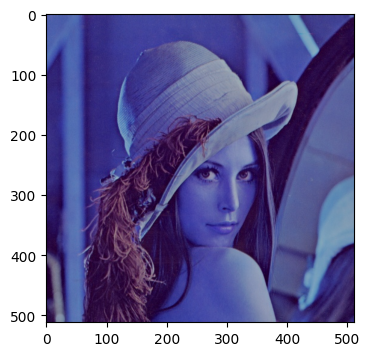

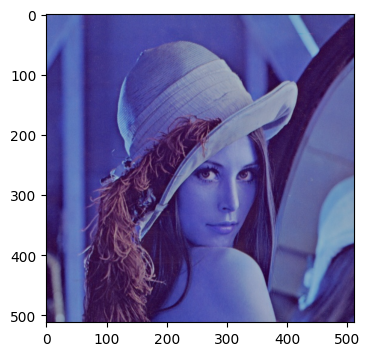

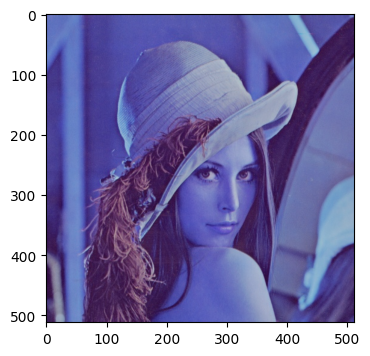

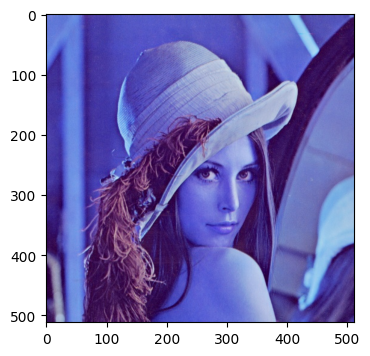

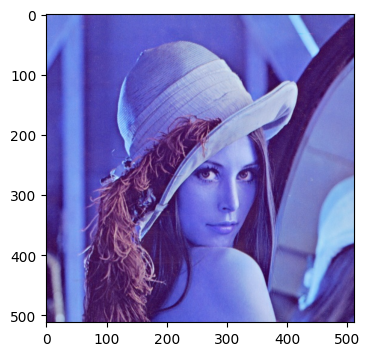

...

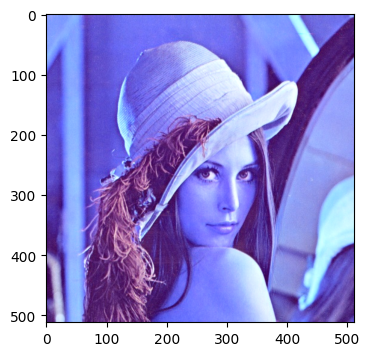

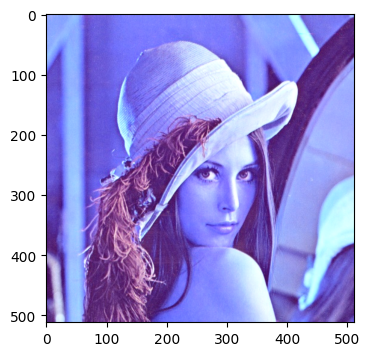

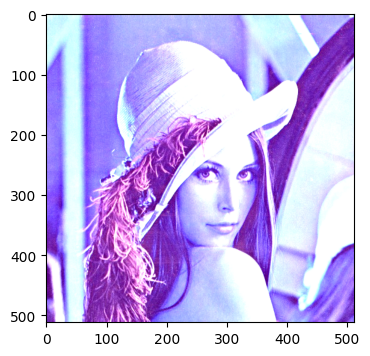

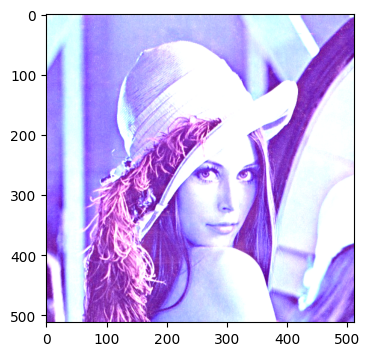

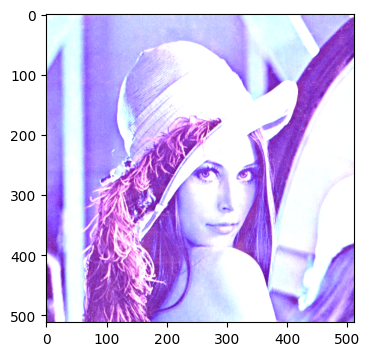

In [17]:
a = [0.8, 1, 1.2, 2]
b = [-10, 0, 10]

for i in range(len(a)):
    for j in range(len(b)):
        new_image = np.clip(a[i] * image.astype(np.int16) + b[j], 0, 255).astype(np.uint8)
        plt.figure(figsize=[4, 4])
        plt.imshow(new_image);

## Нанесение текста и фигур

С помощью OpenCV можно добавить дополнительные элементы на изображение, такие как текст, простые геометрические фигуры и т.д. (см. https://docs.opencv.org/4.x/dc/da5/tutorial_py_drawing_functions.html)

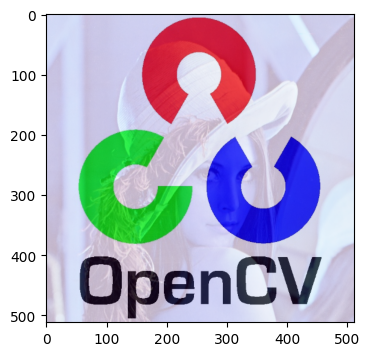

In [18]:
alpha = 0.7
beta = 1 - alpha

logo = cv2.imread('/Users/igor/master/sem_2/cv/data/opencv_logo.jpeg')[..., ::-1]

img_new = np.clip(
    alpha * logo.astype(np.float32) + (1 - alpha) * image.astype(np.float32),
    0, 255
).astype(np.uint8)

plt.figure(figsize=[4, 4])
plt.imshow(img_new);

### Вопрос

- Зачем может понадобиться рисовать на изображении?

# 2. Фильтр Байера

Сырые изображения, приходящие с камеры, являются байеризованными. Они представлены в виде двумерного массива, где отдельные пиксели кодируют интенсивность синего, зеленого, красного цветов. 

![Фильтр Байера](data/bayer.jpeg)


## Домашнее задание (опциональное)

В ноутбуке [`demosaicing.ipynb`](demosaicing.ipynb).

Вспомогательные материалы - [слайды](slides_demosaicing.pdf).


# Часть 2

In [20]:
AERIAL_IMG_PATH = "data/aerial_image.jpg"
SUNFLOWER_IMG_PATH = "data/sunflower.jpg"

if not Path(AERIAL_IMG_PATH).exists() or not Path(SUNFLOWER_IMG_PATH).exists():
    !git clone https://github.com/alexmelekhin/cv_course_2023.git
    !mv cv_course_2023/seminars/seminar_02/data .

# 1. Цветовые пространства

Наиболее распространенным представлением цвета пикселя является пространство RGB. В таком представлении цвет представлен тремя числами: интенсивностями красного, зеленого и синего базисных цветов.

In [21]:
img = cv2.imread(SUNFLOWER_IMG_PATH)

In [22]:
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

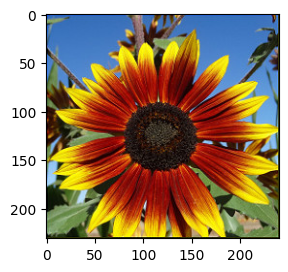

In [23]:
plt.figure(figsize=[3, 3])
plt.imshow(img_rgb);

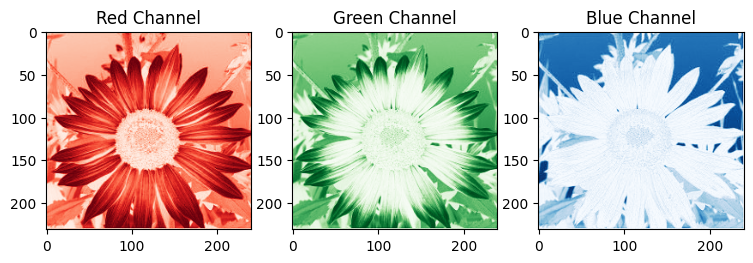

In [24]:
plt.figure(figsize=[9, 3])

plt.subplot(131)
plt.imshow(img_rgb[:,:,0], cmap='Reds')
plt.title('Red Channel')

plt.subplot(132)
plt.imshow(img_rgb[:,:,1], cmap='Greens')
plt.title('Green Channel')

plt.subplot(133)
plt.imshow(img_rgb[:,:,2], cmap='Blues')
plt.title('Blue Channel')

plt.show()

cvtColor поддерживает конвертацию между множеством других цветовых схем. К примеру, чтобы получить серое изобаржение из цветного достаточно:

In [25]:
img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

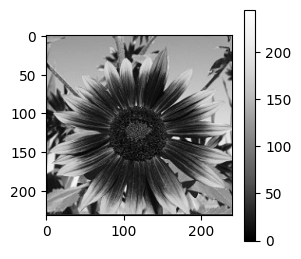

In [26]:
plt.figure(figsize=[3, 3])
plt.imshow(img_gray, cmap='Greys_r')
plt.colorbar()
plt.show()

## Вопрос 1

**Этот и все последующие вопросы - оцениваемые, для самостоятельной работы.**

Можно ли получить черно-белое изображение из RGB представления путем вычисления среднего значения интенсивностей каналов R, G и B? Почему?

**Ответ:**

Можно, однако теряем яркость, т.к. глаза более чувствительны к зеленому цвету

## Вопрос 2

Почему мы использовали флаг `cmap='Greys_r'` при отображении черно-белого изображения? Чем отличается от `cmap='Greys'`?

**Ответ:**
для чб это проще, т.к. интенсивность пикселя определяется интуитивно


Если не предполагается использовать информацию о цвете пикселей, то можно сразу загрузить изображение в оттенках серого:

In [27]:
img_gray = cv2.imread(SUNFLOWER_IMG_PATH, cv2.IMREAD_GRAYSCALE)

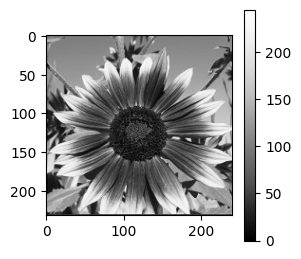

In [28]:
plt.figure(figsize=[3, 3])
plt.imshow(img_gray, cmap='Greys_r')
plt.colorbar()
plt.show()

серое изображение - двумерный массив:

In [29]:
print('type(img_gray) = ', type(img_gray))
print('img_gray.shape = ', img_gray.shape)
print('img_gray.dtype = ', img_gray.dtype)

type(img_gray) =  <class 'numpy.ndarray'>
img_gray.shape =  (231, 240)
img_gray.dtype =  uint8


## Упражнение 1: RGB to gray

**Это и все последующие упражения - оцениваемые, для самостоятельной работы.**

Реализуйте функцию преобразования цветного изображения в формате RGB в серое

In [83]:
def convert_rgb_to_grayscale(img_rgb):
    # return cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    r = img_rgb[:, :, 0].astype(np.int32)
    g = img_rgb[:, :, 1].astype(np.int32)
    b = img_rgb[:, :, 2].astype(np.int32)

    gray = (4899 * r + 9617 * g + 1868 * b + 8192) >> 14
    return gray.astype(np.uint8)


In [82]:
ref = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
my = convert_rgb_to_grayscale(img_rgb)
assert np.allclose(ref, my, atol=1)

In [73]:
assert((cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY) == convert_rgb_to_grayscale(img_rgb)).all())

AssertionError: 

Кроме RGB/BGR и grayscale существуют и другие цветовые представления. Преобразования между ними можно осуществлять с помощью библиотеки OpenCV следующим способом:

## RGB to HSV

HSV - цветовое пространство, в котором цвет представлен тремя компонентами: Hue (оттенок), Saturation (насыщенность) и Value (значение). Это позволяет задавать цвета в более естественной форме, чем RGB.

**Составляющая H** соответствует цветовому тону и варьируется в пределах 0–360°, в частности 0° – чистый красный цвет, 60° – жёлтый, 120° – зеленый, 180° – голубой, 240° – синий, 300° – фиолетовый.

**Насыщенность S** позволяет оценить насколько «чистым» является данный цвет, она определяет соотношение серого цвета и выбранного оттенка и варьируется от 0 (серый) до 1 (полностью насыщенный).

**Мера яркости V** задает относительную освещенность и измеряется в диапазоне от 0 (черный) до 1 (белый).

Цветовая модель HSV связана с моделью RGB нелинейным преобразованием:
$$
H = 
\begin{cases} 
H_1, & \text{если } B \leq G, \\
360^\circ - H_1, & \text{если } B > G, 
\end{cases}
\text{где } H_1 = \arccos\left( \frac{0.5[(R - G) + (R - B)]}{\sqrt{(R - G)^2 + (R - B)(G - B)}} \right),
$$

$$
S = \frac{\max(R, G, B) - \min(R, G, B)}{\max(R, G, B)}, \quad 
V = \frac{\max(R, G, B)}{255}
$$

In [84]:
img_hsv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV)

можно попробовать отобразить изображение так же, как и RGB:

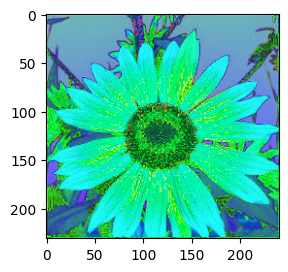

In [85]:
plt.figure(figsize=[3, 3])
plt.imshow(img_hsv);

Однако это не совсем корректно, так как Hue - это угол, а не интенсивность. Поэтому лучше отобразить оттенок в виде цвета, а насыщенность и значение - в виде яркости:

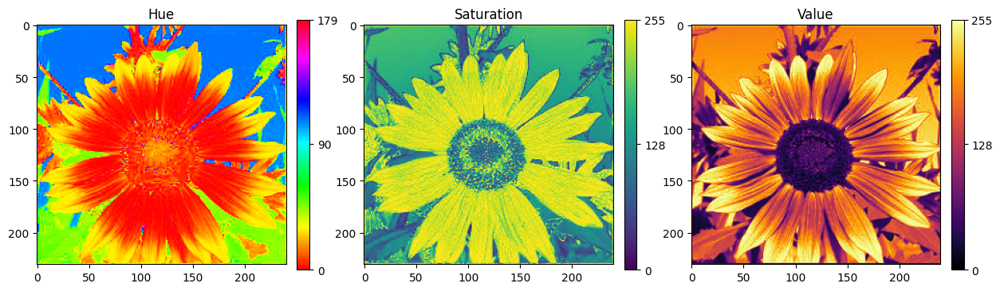

In [86]:
h, s, v = cv2.split(img_hsv)

fig, axs = plt.subplots(1, 3, figsize=[15, 5])

im1 = axs[0].imshow(h, cmap="hsv")
axs[0].set_title('Hue')
cbar1 = plt.colorbar(im1, ax=axs[0], fraction=0.046, pad=0.04, ticks=[0, 90, 179])
cbar1.ax.set_yticklabels(['0', '90', '179'])

im2 = axs[1].imshow(s, cmap="viridis")  # Using 'viridis' for Saturation
axs[1].set_title('Saturation')
cbar2 = plt.colorbar(im2, ax=axs[1], fraction=0.046, pad=0.04, ticks=[0, 128, 255])
cbar2.ax.set_yticklabels(['0', '128', '255'])

im3 = axs[2].imshow(v, cmap="inferno")  # Using 'inferno' for Value
axs[2].set_title('Value')
cbar3 = plt.colorbar(im3, ax=axs[2], fraction=0.046, pad=0.04, ticks=[0, 128, 255])
cbar3.ax.set_yticklabels(['0', '128', '255'])

plt.show()

## Упражнение 2

Попробуйте другие цветовые пространства, конвертация в которые реализована в OpenCV.

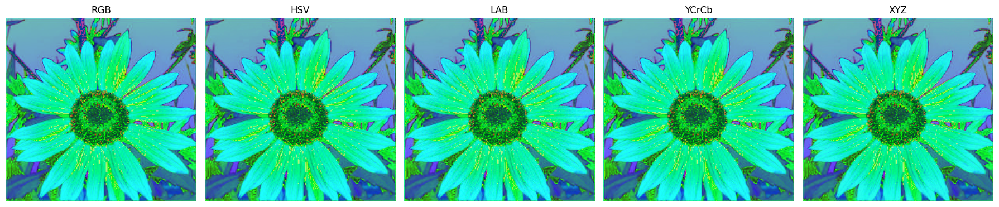

In [89]:
img_hsv   = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV)
img_lab   = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2LAB)
img_ycrcb = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2YCrCb)
img_xyz   = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2XYZ)

fig, ax = plt.subplots(1, 5, figsize=(18, 4))
ax[0].imshow(img_rgb); ax[0].set_title("RGB"); ax[0].axis("off")
ax[1].imshow(cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB)); ax[1].set_title("HSV"); ax[1].axis("off")
ax[2].imshow(cv2.cvtColor(img_lab, cv2.COLOR_LAB2RGB)); ax[2].set_title("LAB"); ax[2].axis("off")
ax[3].imshow(cv2.cvtColor(img_ycrcb, cv2.COLOR_YCrCb2RGB)); ax[3].set_title("YCrCb"); ax[3].axis("off")
ax[4].imshow(cv2.cvtColor(img_xyz, cv2.COLOR_XYZ2RGB)); ax[4].set_title("XYZ"); ax[4].axis("off")
plt.tight_layout()
plt.show()

## Вопрос 3

В каких задачах переход из RGB в другое цветовое пространство может быть полезным?

**Ответ:**
выделять объекты по теням. Полезно для анализа и обработки


# 2. Гистограмма изображения

Напомним, что гистограммой изображения называется функция, показыващая количество пикселей изображения с заданным в качестве аргумента значением интенсивности:

$$
    h(v) = \sum_{x = 0}^{W - 1} \sum_{y = 0}^{H - 1} [f(x, y) = v] 
$$

Если дополнительно потребовать, чтобы $\sum_{v = 0}^{255} h(v) = 1$, то $h$ будет представлять функцию плотности распределения интенсивности на изображении.

Определим вспомогательную функцию, позволяющую визуализировать гистограмму:

In [90]:
def visualize_hist(hist):
    plt.figure(figsize=[12, 3])
    plt.bar(np.arange(len(hist)), hist / hist.sum())

Рассчитать гистограмму можно с помощью встроенной функции OpenCV:

In [91]:
hist_cv = cv2.calcHist([img_gray],      # список изображений
                       [0],             # список каналов
                       None,            # маска (без маски)
                       [256],           # размер гистограммы
                       [0, 256])[:, 0]  # диапазон значений

Результат представляет собой обычный массив длины 256:

In [92]:
print('hist_cv.shape = ', hist_cv.shape)

hist_cv.shape =  (256,)


и выглядит следующим образом:

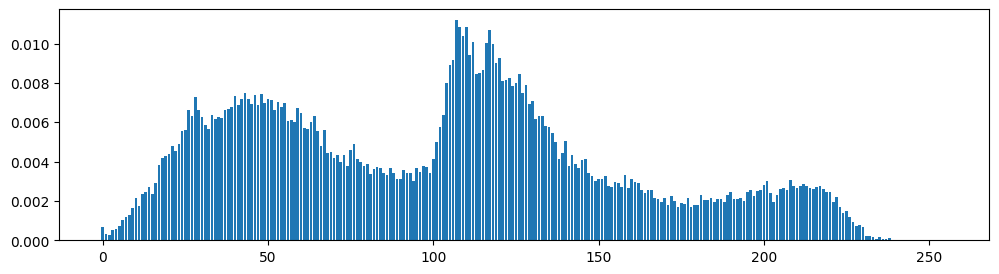

In [93]:
visualize_hist(hist_cv)

## Упражнение 3: Построение гистограммы

Реализуйте функцию для расчета гистограммы изображения. Используйте ее для визуализации трех каналов RGB изображения.

In [94]:
def compute_hist(img):
    hist = np.zeros(256, dtype=np.int64)
    for v in img.ravel():
        hist[v] += 1
    return hist

In [95]:
hist_gray = compute_hist(img_gray)

hist_r = compute_hist(img_rgb[:, :, 0])
hist_g = compute_hist(img_rgb[:, :, 1])
hist_b = compute_hist(img_rgb[:, :, 2])

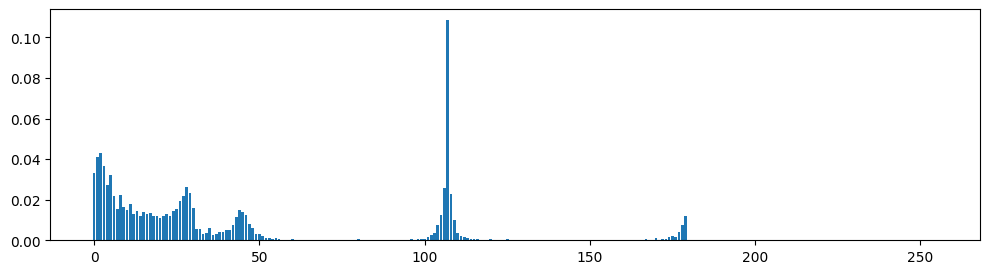

In [96]:
visualize_hist(hist_r)

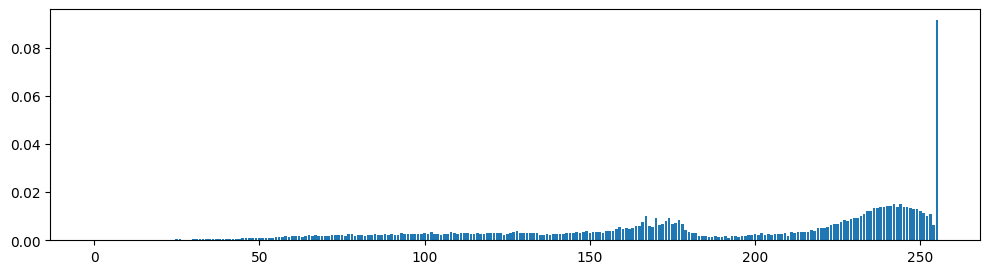

In [97]:
visualize_hist(hist_g)

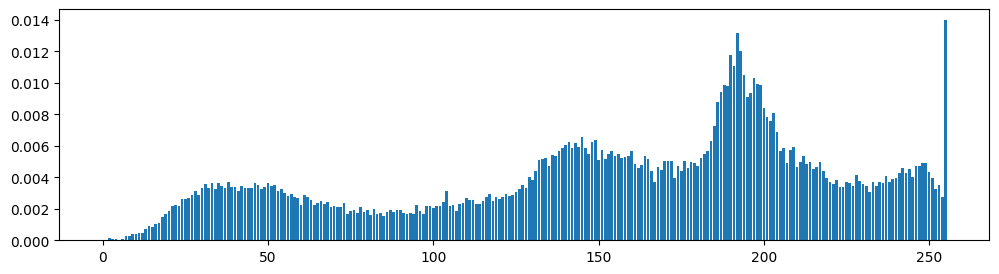

In [98]:
visualize_hist(hist_b)

In [99]:
assert((hist_gray == hist_cv).all())

## Вопрос 4

 Что можно сказать об изображении по его гистограмме?

**Ответ:**
яркость, контраст, засвет, бааланс оттенков


## Вопрос 5

Допустим, вы смотрите некоторый фильм и для текущего кадра выводите его гистограмму. Как будет меняться эта гистограмма с течением времени? Опишите несколько случаев: смена камеры, смена освещения, смена сцены.

**Ответ:**
с течением времени гистограмма будет плавно изменяться

1) плавно меняется
2) сдвиг по яркости
3) скачок гистограммы

## Упражнение 4: JPEG и гистограмма

Исследуйте, как влияет степень сжатия алгоритма JPEG на вид гистограммы изображения.

Используйте черно-белое изображение `img_gray`. Визуализируйте степени сжатия 90, 60, 30, 5.

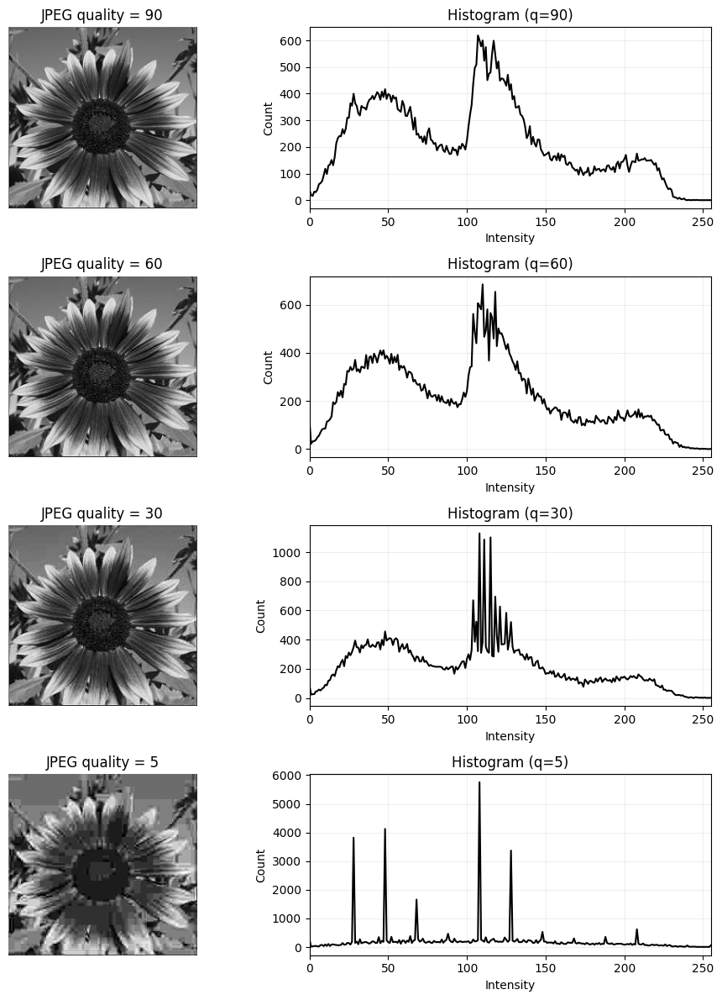

In [101]:
qualities = [90, 60, 30, 5]

fig, axes = plt.subplots(len(qualities), 2, figsize=(10, 12))

for i, q in enumerate(qualities):
    ok, enc = cv2.imencode(".jpg", img_gray, [cv2.IMWRITE_JPEG_QUALITY, q])
    if not ok:
        raise RuntimeError(f"JPEG encode failed for quality={q}")
    dec = cv2.imdecode(enc, cv2.IMREAD_GRAYSCALE)

    hist = np.bincount(dec.ravel(), minlength=256)

    axes[i, 0].imshow(dec, cmap="gray", vmin=0, vmax=255)
    axes[i, 0].set_title(f"JPEG quality = {q}")
    axes[i, 0].axis("off")

    axes[i, 1].plot(hist, color="black")
    axes[i, 1].set_xlim(0, 255)
    axes[i, 1].set_title(f"Histogram (q={q})")
    axes[i, 1].set_xlabel("Intensity")
    axes[i, 1].set_ylabel("Count")
    axes[i, 1].grid(alpha=0.2)

plt.tight_layout()
plt.show()

## Упражнение 5: Сегментация

На загруженном аэроортофотоплане выделите зеленые насаждения. Для этого постройте бинарную маску, где 1 будет отвечать наличию насаждений в данном пикселе, 0 - их отсутствию, и визуализируйте её. А также рассчитайте, какую долю изображения занимают зеленые насаждения. С какой ошибкой (погрешностью) получена эта величина?

**Подсказка:** вам должно помочь HSV пространство и гистограмма. Погрешность может быть оценена на глаз, по вашей неуверенности в определении порога отделения классов 'зеленые насаждения'/'прочее'.

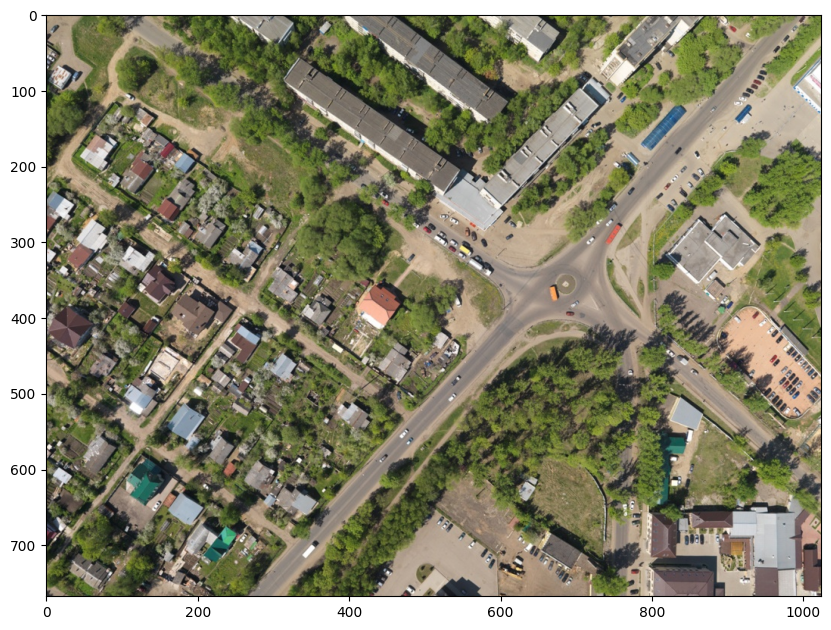

In [102]:
aerial_image = cv2.cvtColor(cv2.imread(AERIAL_IMG_PATH), cv2.COLOR_BGR2RGB)

plt.figure(figsize=[10, 10])
plt.imshow(aerial_image);

Доля зеленых насаждений: 25.59%


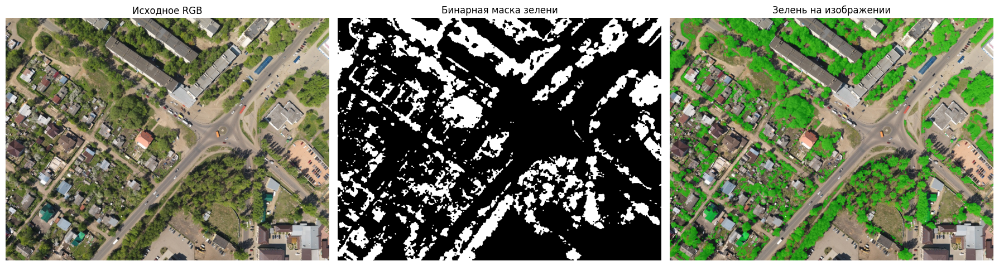

In [104]:
hsv = cv2.cvtColor(aerial_image, cv2.COLOR_RGB2HSV)

lower_green = np.array([35, 40, 30], dtype=np.uint8)   # H, S, V
upper_green = np.array([90, 255, 255], dtype=np.uint8)

mask = cv2.inRange(hsv, lower_green, upper_green)

kernel = np.ones((3, 3), np.uint8)
mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=1)
mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=1)

green_fraction = (mask > 0).mean()
green_percent = 100 * green_fraction

print(f"Доля зеленых насаждений: {green_percent:.2f}%")

fig, ax = plt.subplots(1, 3, figsize=(18, 6))
ax[0].imshow(aerial_image)
ax[0].set_title("Исходное RGB")
ax[0].axis("off")

ax[1].imshow(mask, cmap="gray")
ax[1].set_title("Бинарная маска зелени")
ax[1].axis("off")

overlay = aerial_image.copy()
overlay[mask > 0] = (0.6 * overlay[mask > 0] + 0.4 * np.array([0, 255, 0])).astype(np.uint8)
ax[2].imshow(overlay)
ax[2].set_title("Зелень на изображении")
ax[2].axis("off")

plt.tight_layout()
plt.show()

# 3. Интегральные изображения

## Упражнение 6

Напомним, что интегральным изображением называется следующая функция:

$$
    I(x, y) = \sum_{i = 0}^{x} \sum_{j = 0}^{y} f(i, j)
$$

С помощью интегрального изображения можно за $O(1)$ вычислять сумму интенсивностей в произвольной прямоугольной области. Требуется реализовать расчет интегрального изображения, а также быстрый расчет сумм интенсивностей в прямоугольнике заданном верхним левым углом, шириной и высотой $x, y, w, h$.

$$
    L(x,y) = I(x,y) + L(x,y-1) + L(x-1,y) – L(x-1,y-1)
$$

<img src="data/input_image.jpg" width="30%" /> <img src="data/integral_image.jpg" width="30%" /> <img src="data/rect.jpg" width="30%" />

In [108]:
class IntegralImage:

    def __init__(self, img):
        assert len(img.shape) == 2
        self.img = img
        h, w = img.shape
        self.ii = np.zeros((h + 1, w + 1), dtype=np.int64)
        self.ii[1:, 1:] = np.cumsum(np.cumsum(img.astype(np.int64), axis=0), axis=1)

    def sum(self, x, y, w, h):
        x1, y1 = x, y
        x2, y2 = x + w, y + h
        return (
            self.ii[y2, x2]
            - self.ii[y1, x2]
            - self.ii[y2, x1]
            + self.ii[y1, x1]
        )


In [109]:
I = IntegralImage(img_gray)

In [110]:
x, y, w, h = 0, 0, 100, 100
assert(img_gray[y:y + h, x:x + w].sum() == I.sum(x, y, w, h))

x, y, w, h = 100, 100, 100, 100
assert(img_gray[y:y + h, x:x + w].sum() == I.sum(x, y, w, h))

## Вопрос 6

В каких задачах может потребоваться использовать интегральное изображение?

**Ответ:**
где много раз считаем сумму по прямоугольным окнам
